In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import h5py
import pathlib
import PIL
from sklearn.metrics import accuracy_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [3]:
print(tf.config.list_physical_devices())

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
data_dir = "C:\\Users\\Welcome\\Desktop\\ml\\Tensorflow\\Leaf-Classification\\Code\\plantvillage dataset\\color"
data_dir = pathlib.Path(data_dir)
print(data_dir)

C:\Users\Welcome\Desktop\ml\Tensorflow\Leaf-Classification\Code\plantvillage dataset\color


In [5]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

54303


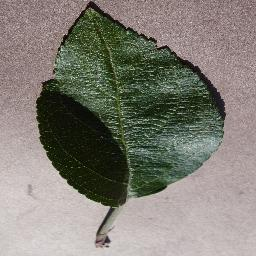

In [6]:
apple_leaves_healthy = list(data_dir.glob('Apple___healthy/*'))
PIL.Image.open(str(apple_leaves_healthy[0]))

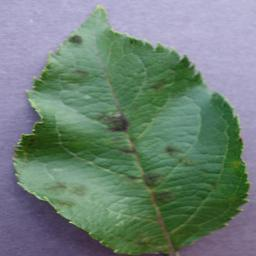

In [7]:
apple_leaves_scab = list(data_dir.glob('Apple___Apple_scab/*'))
PIL.Image.open(str(apple_leaves_scab[0]))

In [8]:
batch_size = 32
img_h = 180
img_w = 180

In [9]:
train_ds = keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.3,
    batch_size=batch_size,
    subset='training',
    image_size=(img_h, img_w),
    seed=123
)

Found 54305 files belonging to 38 classes.
Using 38014 files for training.


In [10]:
val_ds = keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.02,
    batch_size=batch_size,
    subset='validation',
    image_size=(img_h, img_w),
    seed=123
)

Found 54305 files belonging to 38 classes.
Using 1086 files for validation.


In [11]:
print(val_ds.element_spec)

(TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))


In [12]:
class_names = train_ds.class_names
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

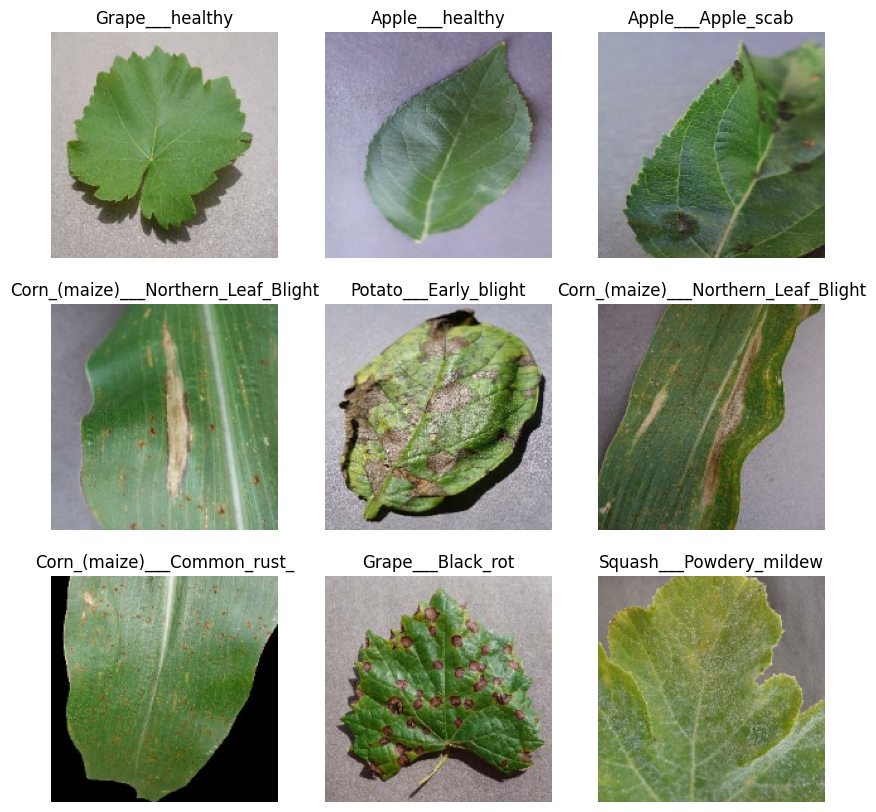

In [13]:
plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.title(class_names[labels[i]])
        plt.axis('off')

In [14]:
for images_batch, labels_batch in train_ds:
    print(images_batch.shape)
    print(labels_batch.shape)
    break

(32, 180, 180, 3)
(32,)


In [15]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(AUTOTUNE)
val_ds = val_ds.cache().prefetch(AUTOTUNE)

In [16]:
total_classes = len(class_names)
print(total_classes)

38


In [17]:
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, total_classes)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, total_classes)))

In [18]:
normalization_layer = layers.Rescaling(scale=1./255)
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))

In [19]:
model = Sequential(
    [
        layers.Rescaling(scale=1./255, input_shape=(img_h, img_w, 3)),
        layers.Conv2D(16, 3, activation='relu', padding='same'),
        layers.MaxPooling2D(),
        layers.Conv2D(32, 3, activation='relu', padding='same'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, 3, activation='relu', padding='same'),
        layers.MaxPooling2D(),
        layers.Dropout(.2),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(total_classes, activation='softmax')
    ]
)

In [20]:
model.compile(optimizer='adam', metrics=['accuracy'], loss='categorical_crossentropy')

In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [22]:
epochs = 1

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

1188/1188 [==============================] - 243s 103ms/step - loss: 1.0234 - accuracy: 0.7054 - val_loss: 0.4737 - val_accuracy: 0.8665


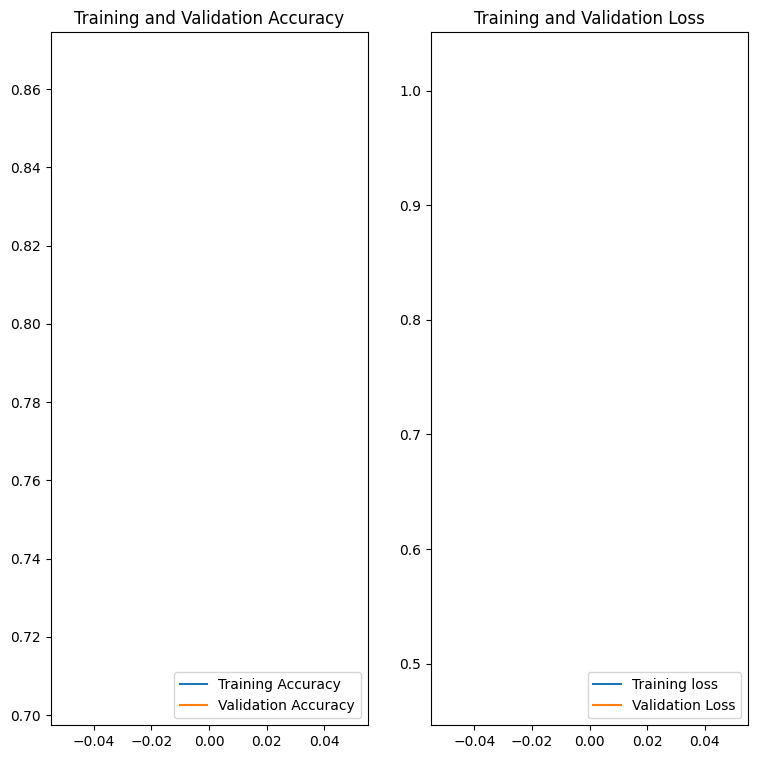

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

range_epochs = range(epochs)

plt.figure(figsize=(9, 9))
plt.subplot(1, 2, 1)
plt.plot(range_epochs, acc, label='Training Accuracy')
plt.plot(range_epochs, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range_epochs, loss, label='Training loss')
plt.plot(range_epochs, val_loss, label='Validation Loss')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss')
plt.show()

In [24]:
def get_file_size(file_path):
    size = os.path.getsize(file_path)
    return size

In [25]:
def convert_bytes(size, unit=None):
    if(unit == "KB"):
        return print('File size: ' + str(round(size / 1024, 3)) + ' Kilobytes')
    elif(unit == "MB"):
        return print('File size: ' + str(round(size / (1024 * 1024), 3)) + ' Megabytes')
    else:
        return print('File size: ' + str(size) + 'bytes')

In [26]:
KERAS_MODEL_NAME = "tf_model_leaf.h5"

In [27]:
model.save(KERAS_MODEL_NAME)

In [28]:
convert_bytes(get_file_size(KERAS_MODEL_NAME), "MB")

File size: 45.755 Megabytes


In [29]:
keras_model_size = get_file_size(KERAS_MODEL_NAME)

In [30]:
test_loss, test_acc = model.evaluate(val_ds, verbose=2)
print('\nTest accuracy is {}%'.format(round(100*test_acc,2)))

34/34 - 1s - loss: 0.4737 - accuracy: 0.8665 - 559ms/epoch - 16ms/step

Test accuracy is 86.65%


In [31]:
TF_LITE_MODEL_NAME = "tf_lite_model_leaf.tflite"

In [32]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = tf_lite_converter.convert()

INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmpd4q2hdl_\assets


INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmpd4q2hdl_\assets


In [33]:
tflite_model_name = TF_LITE_MODEL_NAME
open(tflite_model_name, "wb").write(tflite_model)

15978328

In [34]:
convert_bytes(get_file_size(TF_LITE_MODEL_NAME), "MB")

File size: 15.238 Megabytes


In [35]:
tflite_file_size = get_file_size(TF_LITE_MODEL_NAME)

In [39]:
interpreter = tf.lite.Interpreter(model_path=TF_LITE_MODEL_NAME)
interpreter = tf.lite.Interpreter(model_path = TF_LITE_MODEL_NAME)
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
interpreter.resize_tensor_input(input_details[0]['index'], (32, 180, 180, 3))
interpreter.resize_tensor_input(output_details[0]['index'], (32, 1))
interpreter.allocate_tensors()

for images, labels in val_ds:
    interpreter.set_tensor(input_details[0]['index'], images)
    interpreter.invoke()
    predictions = interpreter.get_tensor(output_details[0]['index'])
    accuracy = tf.keras.metrics.sparse_categorical_accuracy(labels, predictions).numpy().mean()

print(f'Validation Accuracy: {accuracy}')

InvalidArgumentError: {{function_node __wrapped__Squeeze_device_/job:localhost/replica:0/task:0/device:GPU:0}} Can not squeeze dim[1], expected a dimension of 1, got 38 [Op:Squeeze]

In [40]:
print("Input Shape:", input_details[0]['shape'])
print("Input Type:", input_details[0]['dtype'])
print("Output Shape:", output_details[0]['shape'])
print("Output Type:", output_details[0]['dtype'])

Input Shape: [  1 180 180   3]
Input Type: <class 'numpy.float32'>
Output Shape: [ 1 38]
Output Type: <class 'numpy.float32'>


In [41]:
tflite_file_size / keras_model_size

0.3330351405096813

In [42]:
TF_LITE_FLOAT16_MODEL_NAME = "tf_lite_float_16_model.tflite"

In [43]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tf_lite_converter.optimizations = [tf.lite.Optimize.DEFAULT]
tf_lite_converter.target_spec.supported_types = [tf.float16]
tflite_mode = tf_lite_converter.convert() 

INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmp_c4fh43a\assets


INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmp_c4fh43a\assets


In [44]:
open(TF_LITE_FLOAT16_MODEL_NAME, "wb").write(tflite_model)

15978328

In [45]:
tflite_float16_size = get_file_size(TF_LITE_FLOAT16_MODEL_NAME)

In [46]:
convert_bytes(get_file_size(TF_LITE_FLOAT16_MODEL_NAME), "MB")

File size: 15.238 Megabytes


In [47]:
tflite_float16_size / keras_model_size
tflite_float16_size / tflite_file_size

1.0

In [48]:
TF_LITE_SIZE_QUANT_MODEL_FILE_NAME = "tf_lite_quant_model.tflite"

In [55]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tf_lite_converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
tf_lite_converter.convert()

INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmpprn4c3cg\assets


INFO:tensorflow:Assets written to: C:\Users\Welcome\AppData\Local\Temp\tmpprn4c3cg\assets


b' \x00\x00\x00TFL3\x00\x00\x00\x00\x14\x00 \x00\x1c\x00\x18\x00\x14\x00\x10\x00\x0c\x00\x00\x00\x08\x00\x04\x00\x14\x00\x00\x00\x1c\x00\x00\x00\x8c\x00\x00\x00\xe4\x00\x00\x00\x9c\xfa<\x00\xac\xfa<\x00\xd4\x0c=\x00\x03\x00\x00\x00\x01\x00\x00\x00\x04\x00\x00\x00>\x04\xc3\xff\x0c\x00\x00\x00\x1c\x00\x00\x008\x00\x00\x00\x0f\x00\x00\x00serving_default\x00\x01\x00\x00\x00\x04\x00\x00\x00\x90\xff\xff\xff\x15\x00\x00\x00\x04\x00\x00\x00\x07\x00\x00\x00dense_1\x00\x01\x00\x00\x00\x04\x00\x00\x002\x05\xc3\xff\x04\x00\x00\x00\x11\x00\x00\x00rescaling_1_input\x00\x00\x00\x02\x00\x00\x004\x00\x00\x00\x04\x00\x00\x00\xdc\xff\xff\xff\x18\x00\x00\x00\x04\x00\x00\x00\x13\x00\x00\x00CONVERSION_METADATA\x00\x08\x00\x0c\x00\x08\x00\x04\x00\x08\x00\x00\x00\x17\x00\x00\x00\x04\x00\x00\x00\x13\x00\x00\x00min_runtime_version\x00\x19\x00\x00\x00\xb4\xf9<\x00\xac\xf9<\x00\x94\xf9<\x00\xec\xf8<\x00\xdc\xf6<\x00\x0c\xf0<\x00\xbc\xef<\x00,\xef<\x00\x1c\xee<\x00\x0c\xdc<\x00\xfc\x93<\x00\xec\x13\x00\x00\xdc\x00

In [56]:
tflite_model_name = TF_LITE_SIZE_QUANT_MODEL_FILE_NAME
open(tflite_model_name, "wb").write(tflite_model)

15978328

In [57]:
tflite_float_quant_file_size = get_file_size(TF_LITE_SIZE_QUANT_MODEL_FILE_NAME)

In [58]:
convert_bytes(get_file_size(TF_LITE_SIZE_QUANT_MODEL_FILE_NAME), "KB")

File size: 15603.836 Kilobytes


In [59]:
tflite_float_quant_file_size/keras_model_size

0.3330351405096813

In [61]:
tflite_float_quant_file_size/ tflite_float16_file_size

NameError: name 'tflite_float16_file_size' is not defined

In [62]:
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}